In [1]:

import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import numpy as np
import warnings
from eofs.iris import Eof
from eofs.examples import example_data_path
import iris.coord_categorisation
import datetime as dt
import iris.quickplot as qplt
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.feature as cfeature
import xarray as xr
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import simplejson

# This is the section which defines the functions which calculates the geopotential height gradient

The calculation is quite basic, and we have to calculate the geopotential height to the North and the geopotential height to the South:

Gradient to the north:
- Get the geopotential height
- Get the geopotential height at 15 degrees north of that (or as close as we can get to 15 degrees north)
- Divide by the difference in lattitude

Gradient to the south:
- Get the geopotential height
- Get the geopotential height at 15 degrees south of that (or as close as we can get to 15 degrees north)
- Divide by the difference in lattitude

NB use, in the below cell, there is a variable for which the user MUST input the number of geopotential height datapoints there are for each day, for each gridpoint. This was done, as the origional code was used on 6-hr geopotential height data. For daymean data, use n_per_day = 1

In [1]:
n_per_day = 4

In [2]:
#setting up Tabaldi and Molteni fucntion
def GHGN(lat_ind, long_ind, dataset):
    Z_ref = dataset.isel(lat = lat_ind +6, lon = long_ind).to_array()
    ref_lat = Z_ref.__getitem__('lat').values
    Z = dataset.isel(lat = lat_ind,lon = long_ind).to_array()
    lat = Z.__getitem__('lat').values
    return (Z_ref.data[0]-Z.data[0])/(ref_lat-lat)
#defining the geopotential gradient to the south 
def GHGS(lat_ind, long_ind, dataset):
    Z_ref = dataset.isel(lat = lat_ind -6, lon = long_ind).to_array()
    ref_lat = Z_ref.__getitem__('lat').values
    Z = dataset.isel(lat = lat_ind,lon = long_ind).to_array()
    lat = Z.__getitem__('lat').values
    return (Z_ref.data[0]-Z.data[0])/(ref_lat-lat)


# Instantaneous Blocking Calculation 
This section calculates whether a gridpoint is or isn't instantaneously blocked, if it is, then it is given a value 1, if it isn't the value is zero. The logical tests are as follows:
1. Is the meridional geopotential height gradient to the south positve? If yes, move on to 2.
2. Is the meridional geopotential height gradient to the north less than -10? If so, it is blocked.

The code proceeds to loop through each lattitude, longitude and day. It then outputs three lists:
- A list of numerical indexes for each [lat,lon] index at each time which were shown to be blocked.
- A list of arrays, each array corresponding to one day in the period. The arrays correspond directly to the [lat,lon] grid, with 0,1 corresponding to whether there was a block at that gridpoint.

In [16]:
#now to loop through time 
#spits out a list of the time index 
#spits out a list of arrays of where the block is, ordered by day: blocking
#spits out a list containing a list index:
# the first index refers to the date the second list is all the indexs in the grid which are blocked
# the third is a pair of [lat,long] indexes
# v2.0 has a bug fix after the change to regridded coordinates [0,90} 2.5 lat and [-45,45] lon 
def instantaneous_blocking(data):
    
    
    #output lists         
    blocking = list()
    index_list = list()
    tot_index = int(len(data.__getitem__('t').values)/n_per_day)
    length_data = len(data.__getitem__('t').values)
    
    #setting up dates for loop checking one point per day
    dates = np.arange(0,length_data,n_per_day)  #Here this is for a netcdf file for which there are four items per day
    blocking = np.zeros((tot_index,len(data.__getitem__('lat').values),len(data.__getitem__('lon').values)))  #much better to do this len(data.__getitem__('lon'))
    for index in dates:
        time_slice = data.isel(t=index)
        indexes = list()
        #this limits the blocking check to above 20 degrees of lattitude
        for latvar in np.arange(5,len(data.__getitem__('lat').values)-6,1):
            for lonvar in range(len(data.__getitem__('lon').values)):
                ghgn = GHGN(latvar,lonvar,time_slice)
                if ghgn < -10:
                    ghgs = GHGS(latvar,lonvar,time_slice)
                    if ghgs > 0:
                        blocking[int(index/n_per_day),latvar,lonvar] = 1 
                        indexes.append([latvar,lonvar])
        #if a blocked coordinate exists append the index to days
        index_list.append(indexes)
        
        print('done ' + str(int(index/n_per_day + 1)) + '/' + str(tot_index))
    
    return index_list, blocking



# Classification of 5 day blocks:

This is an intersting set of loops, and its input is the index list from the previous calculation. The format of the index list is a list containing lists of grid indexes. There is a list of grid indexes for every day and the function calculates if a grid point is blocked for more than 5 days. 

The algoritm takes the indeces of every coordinate point and sees if there is a block next to it:


In [1]:
class block:
    
    def __init__(self, time_index, list_of_coord_indexes,length):
        self.time_index = time_index      #this is in days past november 30th
        self.list_of_coord_indexes = list_of_coord_indexes 
        self.length = length              #this is in days
    

def get_area(list_of_coords):
    running_area = 0
    circ = 40075
    for item in list_of_coords:
        lat_grid_length = circ/144  #this is for 2.5 degree grids
        lon_grid_length = np.cos(item[1] * 2.5 * np.pi/180)*circ/144
        running_area += lat_grid_length*lon_grid_length
    
    return running_area

def checking_for_blocking2(input_list):
    blocking_list = list()   #final output list
    days_clusters = list()   #this list contains all the clusters for each day
    for k in range(len(input_list)): #len(input_list)     #this is out through time loop
        #makes a list copy
        day = input_list[k][:]        # this is app the coords in the index list
        final_cluster_list = list()   
        
        #cycles through blocked coordinates - THE VARIABLE DAY REFERES TO ALL THE BLOCKED COORDINATES IN THE DAY
        while day != list():
            cluster_list = list()    # list of coordinates in the cluster
            initial_coord = day[0]
            cluster_list.append(initial_coord)
            cluster_new_items = [initial_coord]  #new items in the cluster 
            # these are the test items
        
            while cluster_new_items != list():
                test = list()
                for coord in cluster_new_items:
                    n = [coord[0]+1,coord[1]]
                    test.append(n)
                    e = [coord[0],coord[1]+1]
                    test.append(e)
                    s = [coord[0]-1,coord[1]]
                    test.append(s)
                    w = [coord[0],coord[1]-1]
                    test.append(w)
                unique_test = list()
                for i in test:
                    if i not in unique_test:
                        unique_test.append(i)
                #now we have all the items to test 
                cluster_new_items = [x for x in unique_test if x in day and x not in cluster_list]
                for item in cluster_new_items:
                    cluster_list.append(item)
                for coord in cluster_list:
                    if coord in day:
                        day.remove(coord)
                if cluster_new_items == list():
                    cluster_list = sorted(cluster_list)
                    if cluster_list in final_cluster_list:
                        pass
                    else:
                        final_cluster_list.append(cluster_list)
            l_list = list()
            for l in range(len(final_cluster_list)):
                area = get_area(final_cluster_list[l])
                if area < 1000000:
                    l_list.append(l)
            for item in l_list:
                final_cluster_list.remove(final_cluster_list[item])
        
                       
                #adds the new items to cluster list
                #removes items in day so they are no longer added to cluster list                    
        days_clusters.append(final_cluster_list)    #this is the list of clusters for every day 
        
        # There are 90+ items in this list
        # so it is a list of lists - which is the clusters in the day
        # the nect 
        # Each item contains the clusters for that day
        # Each cluster contains the indexes for the coordinates which are instantaneoysly blocked 
        
        if k%30 == 0:
            print('done ' + str(k))
    
        ################## CLUSTERING ALGORITHM UP AND RUNNING #########################
  
    
    time_index = 0
    while len(days_clusters) > 4:
        # all the clusters in a day
        current_day = days_clusters[0][:]                   #analysing the front of the list, first layer!
        for current_cluster in current_day:      
            cluster_coord_list = list()
            cluster_coord_list.append(current_cluster)    # this is all the coordinates in the cluster we're looking at
            test_cluster = current_cluster[:]             # this to set up the contour overlap condition
            k=1
            while k>0:
                found = False         # this is to mark if we have no match found yet
                
                if k == len(days_clusters):
                    length = k
                    if length >= 5:#checks if the block is long enough 
                        blocking_list.append(block(time_index,cluster_coord_list,length))
                    break
                
                for item in days_clusters[k]:    # this item is a cluster the next day    
                    
                    
                    intersection = [x for x in item if x in test_cluster]     #this is the intersection of the clusters
                         

                    if len(intersection) > 0.7*len(test_cluster) or len(intersection)> 0.7*len(item):
                        found = True
                        cluster_coord_list.append(item)
                        #here we update test item
                        #test_cluster = item[:]
                        k+=1
                        break 
                    else:
                        pass
  
                #We have looked through all the clusters and there is no match in the below case
                
                if found == False:
                    length = k
                    if length >= 5:#checks if the block is long enough 
                        blocking_list.append(block(time_index,cluster_coord_list,length))
                    break
                
            
            # removing clusters from the main list which have been analysed
            for l in range(length): 
                #check if it exists in the correct day
                if cluster_coord_list[l] in days_clusters[l]:
                    days_clusters[l].remove(cluster_coord_list[l])
        days_clusters.remove(days_clusters[0])
 
        
        time_index += 1
    
        
    return blocking_list
        
                      
    
  

# The below cell applies the method
This creates a text file containing information of all the blocks:
- The number day in the season which the block occured
- The length of the block
- The netcdf4 index (not the lat/lon, but the lat/lon INDEX) coordinates which were blocked 
- A future version (expected 06/22) will output a NETCDF4 file containing positions of blocked points, at the moment, the notebook tm90_to_netcdf will do 

#### Beyond this point in the code, were plots generated for weekly presentations, and are not relevant for the analysis in the dissertation.

In [ ]:
#cycling through all years data
file_route = '~/Atmospheric_blocking/data/'
end = 'djf_final.nc'

def write_blocks(file,blocked_indexes):
    for i in range(len(blocked_indexes)):
        file.write('\nDay '+ str(i) + ':')
        for coord in blocked_indexes[i]:
            file.write('\n' + str(coord[0]) + ',' + str(coord[1]))

for year in np.arange(1980,2019,1):
    filename = file_route + str(year) + end  #correct filename
    data = xr.open_dataset(filename)
    data = data.isel(p=15)
    
    #calculating instantaneous blocking
    index_list, instantaneous_blocking_list = instantaneous_blocking(data) 
    
    #LSB calculation
    lsb_list = checking_for_blocking2(index_list)
    
    # creating an array to save -- NEED TO WRITE ALGORITHM TO CONVERT
    text_file_path = "/home/users/dmtw2/Atmospheric_blocking/out_data/{}/EUR_LSB_djf_{}.txt".format(year,year)
    f = open(text_file_path, 'w')
    
    if lsb_list == list():
        f.write('None')
    for thingy in lsb_list:
        f.write('Start Index:\n')
        f.write(str(thingy.time_index))
        f.write('\nLength in days:\n')
        f.write(str(thingy.length))
        f.write('\nBlocked indexes list:\n')
        write_blocks(f,thingy.list_of_coord_indexes)
        f.write('\n---\n')
    
    
    f.close()
   

# PLOTTING OF BLOCKS FOR THE REPORT 
This section plots the geopotential height and the blocking episodes, the instantaneously blocked points and a contor plot for geopotential height.
This function is plot_of_blocks and takes the following variables:
- The roar NETCDF4 file for the plotting for an entire DJF season (5th arg)
- The day index which you want to start the plotting  (1st arg)
- The day index you want to end plotting (2nd arg)
- The instantaneous blocking list (output from (instantaneous blocking)
- The regridded NETCDF4 file 

In [8]:
LAND = cfeature.NaturalEarthFeature('physical', 'land', '50m',
                                    edgecolor='face',
                                    facecolor=cfeature.COLORS['land'])

def make_map(bbox, projection=ccrs.PlateCarree()):
    fig, ax = plt.subplots(figsize=(15,15),
                           subplot_kw=dict(projection=projection))
    ax.set_extent(bbox)
    ax.add_feature(LAND, facecolor='None')
    ax.coastlines(resolution='50m')
    gl = ax.gridlines(draw_labels=True)
    gl.xlabels_top = gl.ylabels_right = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    XTEXT_SIZE =25
    YTEXT_SIZE =25
    gl.xlabel_style = {'size': XTEXT_SIZE, 'color': 'k'}
    gl.ylabel_style = {'size':YTEXT_SIZE, 'color': 'k', 'weight': 'normal'}
    
    return fig, ax

def plot_of_blocks(day_index0,day_index1, blocking_list, data_regrid,data_roar): #here blocking list is our list of blocked 
#requires you to have data_for_inst_loaded
    plt.clf
    #bbox = [lons.min(), lons.max(), lats.min(), lats.max()]
    bbox=[-90, 60, 0, 90]
    import numpy as np
    import numpy.ma as ma
    level = 10  # 10 meters temperature.
    lats = data_roar.__getitem__('latitude').values
    lons = data_roar.__getitem__('longitude').values
    x,y = lons,lats
    for day in np.arange(day_index0,day_index1,1):
        plt.clf
        fig, ax = make_map(bbox=bbox)
        list_of_blocked_lats = list()
        index_list = list()
        list_of_blocked_lons =list ()
        for i in range(36):
            for j in range(36):
                if blocking_list[day - 1][i,j] == 1:
                    list_of_blocked_lats.append(data_regrid.__getitem__('lat').values[i])
                    list_of_blocked_lons.append(data_regrid.__getitem__('lon').values[j])
                    index_list.append([i,j])
        data1 = data_roar.to_array().data[0,4*(day-1),:,:]
        plt.scatter(list_of_blocked_lons,list_of_blocked_lats, zorder=1,marker = 'o',s=15,c='red')          #scatter
        cs = ax.pcolormesh(x, y, data1,cmap='viridis',zorder = -1)   #colourmesh
        con = ax.contour(x,y,data1,colors ='w', levels = 7)
        ax.clabel(con,fontsize=9,inline = True)
        plt.title('Day '+ str(day), fontsize=30)
        cbar = fig.colorbar(cs, orientation='vertical',extend='both', shrink = 0.6)
        cbar.set_label('Geopotential height /m', fontsize =15)
        cbar.ax.tick_params(labelsize=10)
        plt.show()

def plot_of_regrid(day_index0,day_index1, blocking_list, data_regrid): #here blocking list is our list of blocked 
#requires you to have data_for_inst_loaded
    plt.clf
    #bbox = [lons.min(), lons.max(), lats.min(), lats.max()]
    bbox=[-90, 60, 0, 90]
    import numpy as np
    import numpy.ma as ma
    level = 10  # 10 meters temperature.
    lats = data_regrid.__getitem__('lat').values
    lons = data_regrid.__getitem__('lon').values
    x,y = lons,lats
    for day in np.arange(day_index0,day_index1,1):
        plt.clf
        fig, ax = make_map(bbox=bbox)
        list_of_blocked_lats = list()
        index_list = list()
        list_of_blocked_lons =list ()
        for i in range(36):
            for j in range(36):
                if blocking_list[day - 1][i,j] == 1:
                    list_of_blocked_lats.append(data_regrid.__getitem__('lat').values[i])
                    list_of_blocked_lons.append(data_regrid.__getitem__('lon').values[j])
                    index_list.append([i,j])
        data1 = data_regrid.to_array().data[0,4*(day-1),:,:]
        plt.scatter(list_of_blocked_lons,list_of_blocked_lats, zorder=1,marker = 'o',s=15,c='red')          #scatter
        cs = ax.pcolormesh(x, y, data1,cmap='viridis',zorder = -1)   #colourmesh
        con = ax.contour(x,y,data1,colors ='w', levels = 7)
        ax.clabel(con,fontsize=9,inline = True)
        plt.title('Day '+ str(day), fontsize=30)
        cbar = fig.colorbar(cs, orientation='vertical',extend='both', shrink = 0.6)
        cbar.set_label('Geopotential height /m', fontsize =15)
        cbar.ax.tick_params(labelsize=10)
        plt.show()

## The Plot of LSBs (Large Scale Blocking) 
The syntax is as follows:
- First variable is the index of the first day you want to plot 
- Second variable is the final day you want to plot
- Third variable is the 'blocking_list' which is a list of arrays with 1/0 denoting an INSTANTANEOUS block
- Fourth varible is the regridded data (which is found in the scratch-nopw/dmtw2
- Fifth variable is the roar ERA-INTERIM data
- Sixth and final variable for this plot is the large scale blocking event list, which is 1/0 again, a list of 2D arrays /work/scratch-nopw/dmtw2/final_data/data

In [7]:
def plot_of_blocks_with_LSB(day_index0,day_index1, blocking_list, data_regrid, data_roar, lsb_list):
    plt.clf
    #bbox = [lons.min(), lons.max(), lats.min(), lats.max()]
    bbox=[-90, 60, 0, 90]
    import numpy as np
    import numpy.ma as ma
    level = 10  # 10 meters temperature.
    lats = data_roar.__getitem__('latitude').values
    lons = data_roar.__getitem__('longitude').values
    x,y = lons,lats
    for day in np.arange(day_index0,day_index1,1):
        plt.clf
        fig, ax = make_map(bbox=bbox)
        list_of_blocked_lats = list()
        index_list = list()
        list_of_blocked_lons =list ()
        for i in range(36):
            for j in range(36):
                if blocking_list[day - 1][i,j] == 1:
                    list_of_blocked_lats.append(data_regrid.__getitem__('lat').values[i])
                    list_of_blocked_lons.append(data_regrid.__getitem__('lon').values[j])
                    index_list.append([i,j])
        
        #getting LSBs index lists
        lsb_lats = list()
        lsb_lons = list()
        for lsb in lsb_list:
            t_s = lsb.time_index
            t_e = lsb.time_index + lsb.length
            if t_s <= day <= t_e:
                index_of_coords = day - t_s
                list_of_blocked_coords =lsb.list_of_coord_indexes[index_of_coords]
                #getting lsb coords
                for coord in list_of_blocked_coords:
                    lsb_lats.append(data_regrid.__getitem__('lat').values[coord[0]])
                    lsb_lons.append(data_regrid.__getitem__('lon').values[coord[1]])
        
        
        
                
        data1 = data_roar.to_array().data[0,4*(day-1),:,:]
        plt.scatter(list_of_blocked_lons,list_of_blocked_lats, zorder=1,marker = 'o',s=15,c='red',label = 'Instantaneous Blocking')          #scatter instant          
        plt.scatter(lsb_lons,lsb_lats, zorder=2,marker = 's',s=15,c='magenta',label = 'Large Scale Blocking Event') #scatter lsb
        cs = ax.pcolormesh(x, y, data1,cmap='viridis',zorder = -1)   #colourmesh
        con = ax.contour(x,y,data1,colors ='w', levels = 7)
        ax.clabel(con,fontsize=9,inline = True)
        plt.title('Day '+ str(day), fontsize=30)
        cbar = fig.colorbar(cs, orientation='vertical',extend='both', shrink = 0.6)
        cbar.set_label('Geopotential height /m', fontsize =15)
        cbar.ax.tick_params(labelsize=10)
        plt.legend()
        plt.show()

In [8]:
#getting dataset for plot
year = 2008
opening_string = '/badc/ecmwf-era-interim/data/gg/ap/'
mode = 'djf'
list_of_variables = ['T','W','STRF','VPOT','U','V','R','VO','D','PV','Q','O3','CLWC','CIWC','CC']
if mode == 'djf':
    prev_year = year - 1
    dec = opening_string + str(prev_year) + '/12/*/*.nc'
    jan = opening_string + str(year) + '/01/*/*.nc'
    feb = opening_string + str(year) + '/02/*/*.nc'
    data_dec = xr.open_mfdataset(dec, drop_variables =list_of_variables)
    data_jan = xr.open_mfdataset(jan, drop_variables =list_of_variables)
    data_feb = xr.open_mfdataset(feb, drop_variables =list_of_variables)
    data_roar = xr.concat([data_dec,data_jan,data_feb],dim='t')
data_roar = data_roar.isel(p=15)

KeyboardInterrupt: 

# 0 degrees lat plot

This plot compares the Z500 at zero degrees lattitude.

In [ ]:
#checking zero degrees lat and zero degrees lon
#there is something wrong with the regridding at zero degrees long
data_at_zero = data.isel(longitude = 0,t=0).to_array().data
data_at_360 = data.isel(longitude = 35,t=0).to_array().data
data_at_2  = data.isel(longitude = 1,t=0).to_array().data
roar_07 = data_roar.isel(longitude = 1,t=0).to_array().data
roar_359 = data_roar.isel(longitude = 511, t=0).to_array().data
plt.clf
plt.rcParams["figure.figsize"] = (15,10)
plt.plot(data.__getitem__('lat').values,data_at_zero[0,:],'ko',linewidth = 2, label = '0 degrees lon - ERA INTERIM 2.5 degree regrid')
plt.plot(data.__getitem__('lat').values,data_at_360[0,:],'ro',linewidth=2, label = '357.5 degrees lon - ERA INTERIM 2.5 degree regrid')
plt.plot(data.__getitem__('lat').values,data_at_2[0,:],'bo', linewidth =2, label = '2.5 degrees lon - ERA INTERIM 2.5 degree regrid')
plt.plot(data_roar.__getitem__('latitude').values,roar_07[0,:], label = '0.7 degrees lon - ERA INTERIM')
plt.plot(data_roar.__getitem__('latitude').values,roar_359[0,:],label = '359.3 degrees lon - ERA INTERIM')
plt.xlim([20,90])
plt.ylim([49000,59000])
plt.legend(fontsize = 15)
plt.ylabel('Geopotential height /m', fontsize= 20)
plt.xlabel('Latitude /degrees', fontsize= 20)
plt.title('Plot Showing Regrid Error at 0 Degrees Longitude', fontsize=20)
plt.show

In [ ]:
plot_of_blocks_with_LSB(10,25,blocking_2008,data,data_roar,blocking_list_2008)

# Output Arrays
There are two outputs for each year:
- Instantaneous blocking list.csv 
- LSB list.txt 


In [31]:
year = 2008
file_route = '~/Atmospheric_blocking/data/'
end = 'djf_final.nc'
filename = file_route + str(year) + end
data = xr.open_dataset(filename)
data = data.isel(p=15)
index_list, instantaneous_blocking_list = instantaneous_blocking(data)
    

done 1/91
done 2/91
done 3/91
done 4/91
done 5/91
done 6/91
done 7/91
done 8/91
done 9/91
done 10/91
done 11/91
done 12/91
done 13/91
done 14/91
done 15/91
done 16/91
done 17/91
done 18/91
done 19/91
done 20/91
done 21/91
done 22/91
done 23/91
done 24/91
done 25/91
done 26/91
done 27/91
done 28/91
done 29/91
done 30/91
done 31/91
done 32/91
done 33/91
done 34/91
done 35/91
done 36/91
done 37/91
done 38/91
done 39/91
done 40/91
done 41/91
done 42/91
done 43/91
done 44/91
done 45/91
done 46/91
done 47/91
done 48/91
done 49/91
done 50/91
done 51/91
done 52/91
done 53/91
done 54/91
done 55/91
done 56/91
done 57/91
done 58/91
done 59/91
done 60/91
done 61/91
done 62/91
done 63/91
done 64/91
done 65/91
done 66/91
done 67/91
done 68/91
done 69/91
done 70/91
done 71/91
done 72/91
done 73/91
done 74/91
done 75/91
done 76/91
done 77/91
done 78/91
done 79/91
done 80/91
done 81/91
done 82/91
done 83/91
done 84/91
done 85/91
done 86/91
done 87/91
done 88/91
done 89/91
done 90/91
done 91/91


In [17]:
#cycling through all years data
file_route = '~/Atmospheric_blocking/data/'
end = 'djf_final.nc'

def write_blocks(file,blocked_indexes):
    for i in range(len(blocked_indexes)):
        file.write('\nDay '+ str(i) + ':')
        for coord in blocked_indexes[i]:
            file.write('\n' + str(coord[0]) + ',' + str(coord[1]))

for year in np.arange(1980,2019,1):
    filename = file_route + str(year) + end  #correct filename
    data = xr.open_dataset(filename)
    data = data.isel(p=15)
    
    #calculating instantaneous blocking
    index_list, instantaneous_blocking_list = instantaneous_blocking(data) 
    
    #saving instantaneous blocking list
    !mkdir ~/Atmospheric_blocking/out_data/{year}
    arr_reshaped = instantaneous_blocking_list.reshape(instantaneous_blocking_list.shape[0], -1)
    np.savetxt("/home/users/dmtw2/Atmospheric_blocking/out_data/{}/inst_djf_{}.txt".format(year,year), arr_reshaped)
    
    #LSB calculation
    lsb_list = checking_for_blocking2(index_list)
    
    
    # creating an array to save -- NEED TO WRITE ALGORITHM TO CONVERT
    text_file_path = "/home/users/dmtw2/Atmospheric_blocking/out_data/{}/EUR_LSB_djf_{}.txt".format(year,year)
    f = open(text_file_path, 'w')
    
    if lsb_list == list():
        f.write('None')
    for thingy in lsb_list:
        f.write('Start Index:\n')
        f.write(str(thingy.time_index))
        f.write('\nLength in days:\n')
        f.write(str(thingy.length))
        f.write('\nBlocked indexes list:\n')
        write_blocks(f,thingy.list_of_coord_indexes)
        f.write('\n---\n')
    
    
    f.close()
   
     
    

    
    

done 1/91
done 2/91
done 3/91
done 4/91
done 5/91
done 6/91
done 7/91
done 8/91
done 9/91
done 10/91
done 11/91
done 12/91
done 13/91
done 14/91
done 15/91
done 16/91
done 17/91
done 18/91
done 19/91
done 20/91
done 21/91
done 22/91
done 23/91
done 24/91
done 25/91
done 26/91
done 27/91
done 28/91
done 29/91
done 30/91
done 31/91
done 32/91
done 33/91
done 34/91
done 35/91
done 36/91
done 37/91
done 38/91
done 39/91
done 40/91
done 41/91
done 42/91
done 43/91
done 44/91
done 45/91
done 46/91
done 47/91
done 48/91
done 49/91
done 50/91
done 51/91
done 52/91
done 53/91
done 54/91
done 55/91
done 56/91
done 57/91
done 58/91
done 59/91
done 60/91
done 61/91
done 62/91
done 63/91
done 64/91
done 65/91
done 66/91
done 67/91
done 68/91
done 69/91
done 70/91
done 71/91
done 72/91
done 73/91
done 74/91
done 75/91
done 76/91
done 77/91
done 78/91
done 79/91
done 80/91
done 81/91
done 82/91
done 83/91
done 84/91
done 85/91
done 86/91
done 87/91
done 88/91
done 89/91
done 90/91
done 91/91
mkdir: c

NameError: name 'checking_for_blocking2' is not defined

# Test of 1980 
There was a None for 1980-1986. Hypothesis is that there is a problem with the writer of the output file:
- Check there are no LSB blocks, if there are, fix the writer, if there arent then look further, like at the input data to see if I need to redo the data finding 


In [47]:


#getting dataset for plot
year = 2008
opening_string = '/badc/ecmwf-era-interim/data/gg/ap/'
mode = 'djf'
list_of_variables = ['T','W','STRF','VPOT','U','V','R','VO','D','PV','Q','O3','CLWC','CIWC','CC']
if mode == 'djf':
    prev_year = year - 1
    dec = opening_string + str(prev_year) + '/12/*/*.nc'
    jan = opening_string + str(year) + '/01/*/*.nc'
    feb = opening_string + str(year) + '/02/*/*.nc'
    data_dec = xr.open_mfdataset(dec, drop_variables =list_of_variables)
    data_jan = xr.open_mfdataset(jan, drop_variables =list_of_variables)
    data_feb = xr.open_mfdataset(feb, drop_variables =list_of_variables)
    data_roar = xr.concat([data_dec,data_jan,data_feb],dim='t')
data_roar = data_roar.isel(p=15)


/opt/jaspy/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/opt/jaspy/lib/python3.8/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


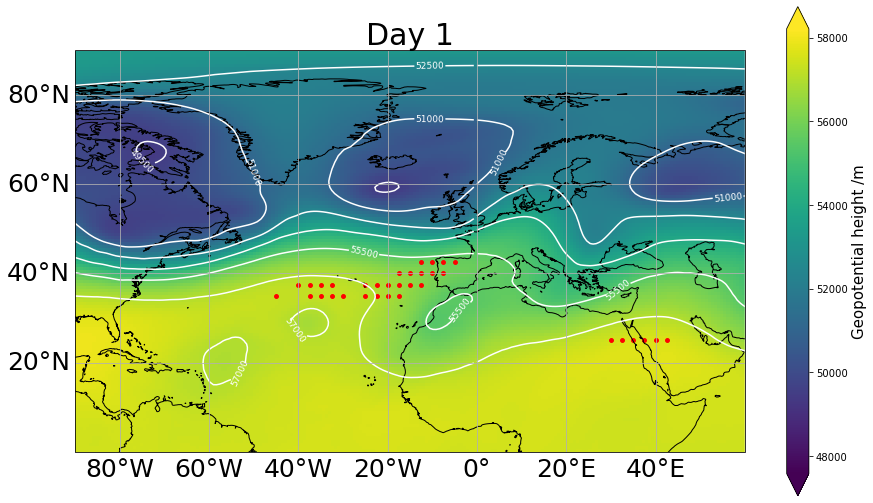

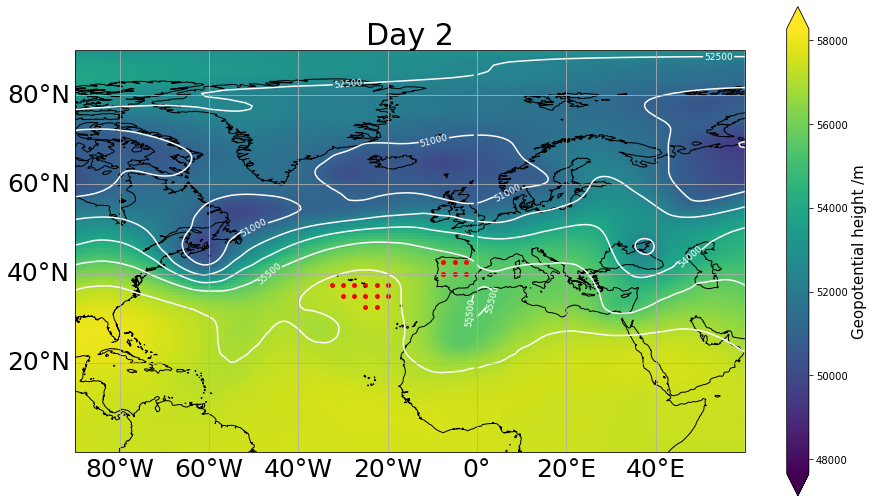

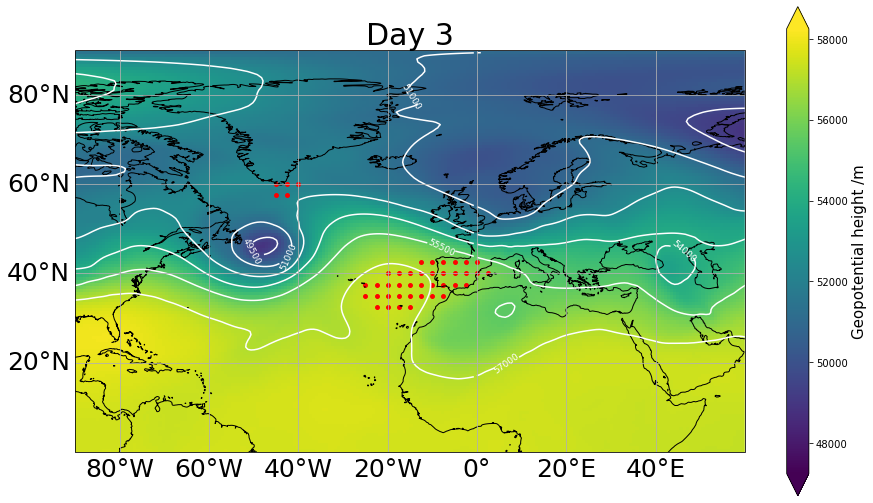

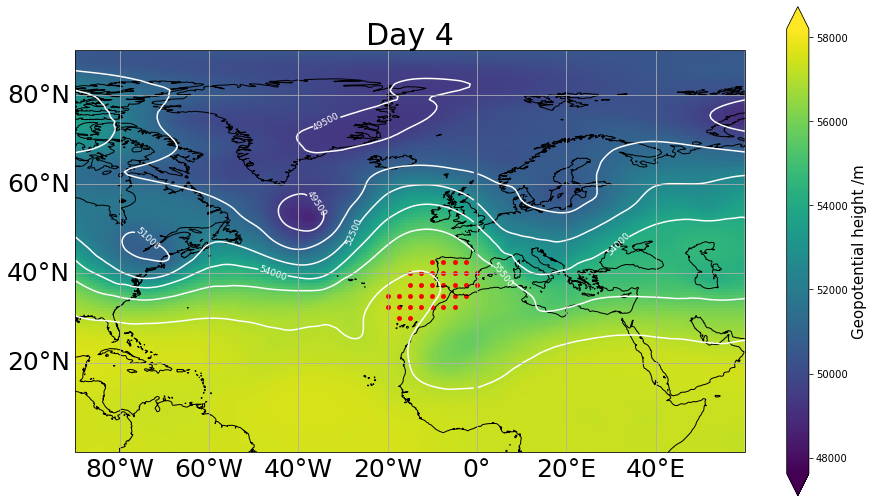

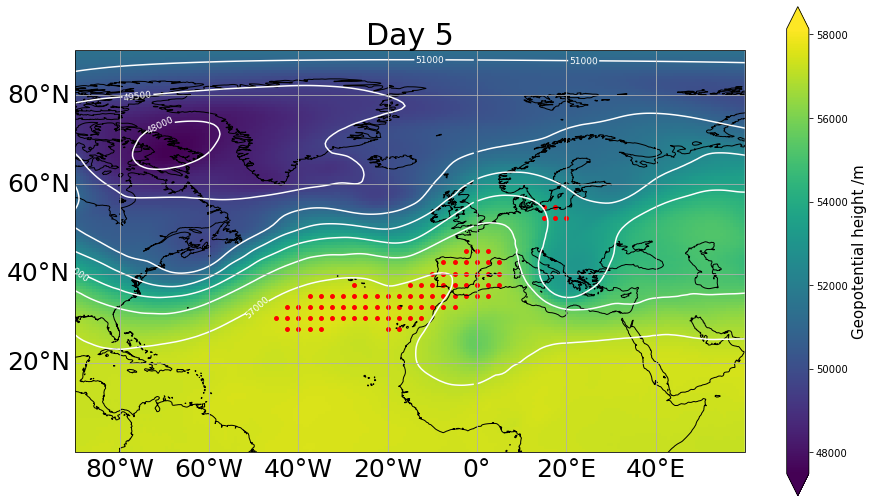

...

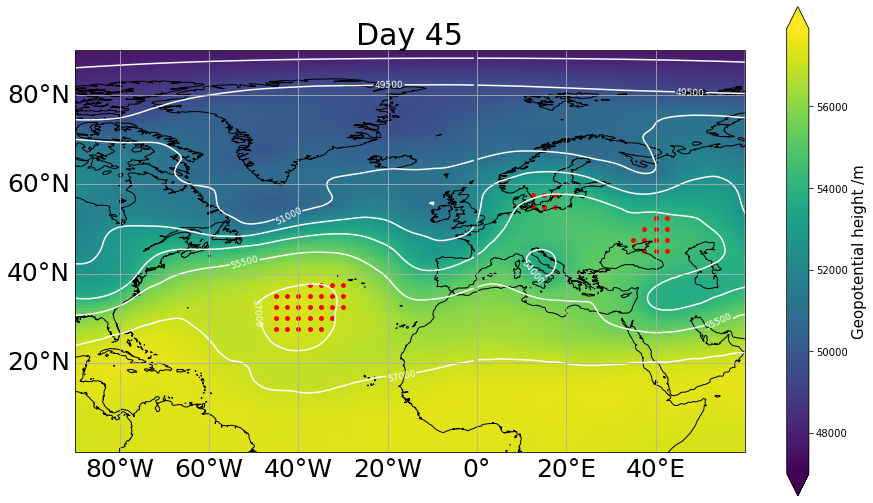

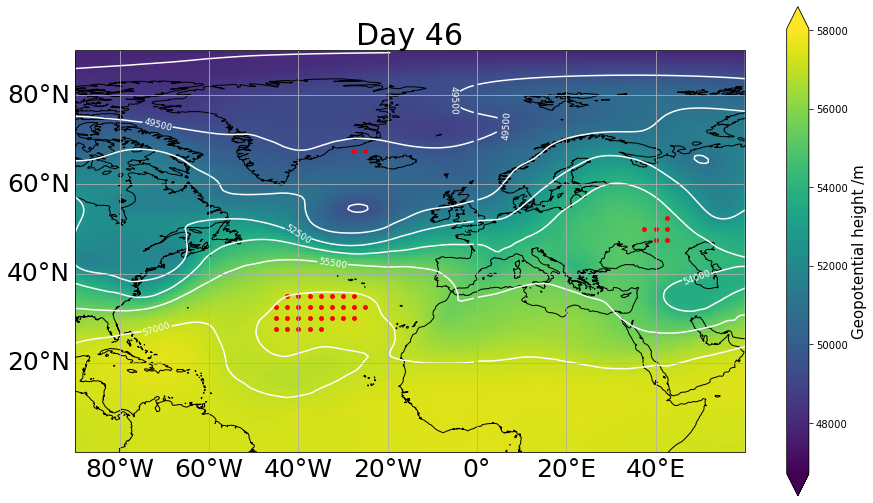

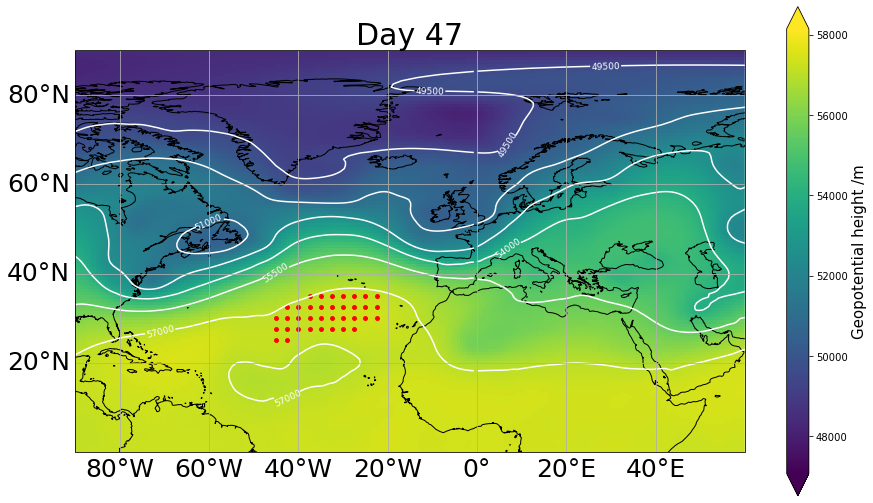

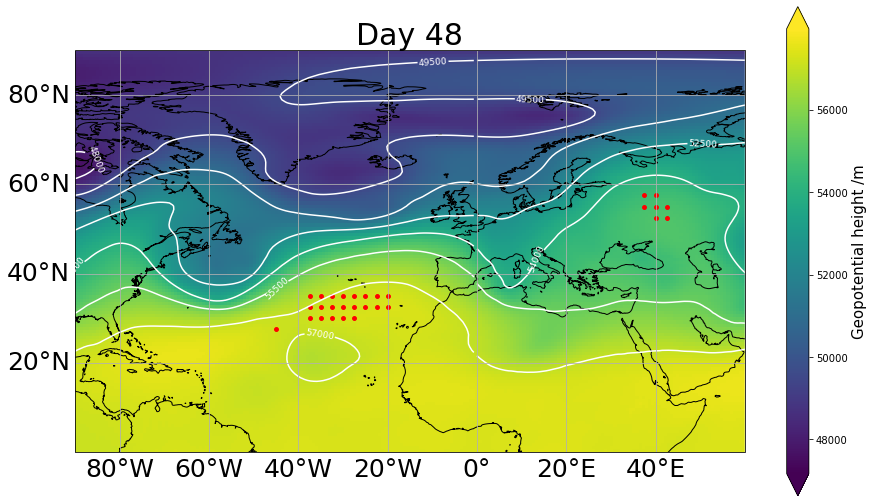

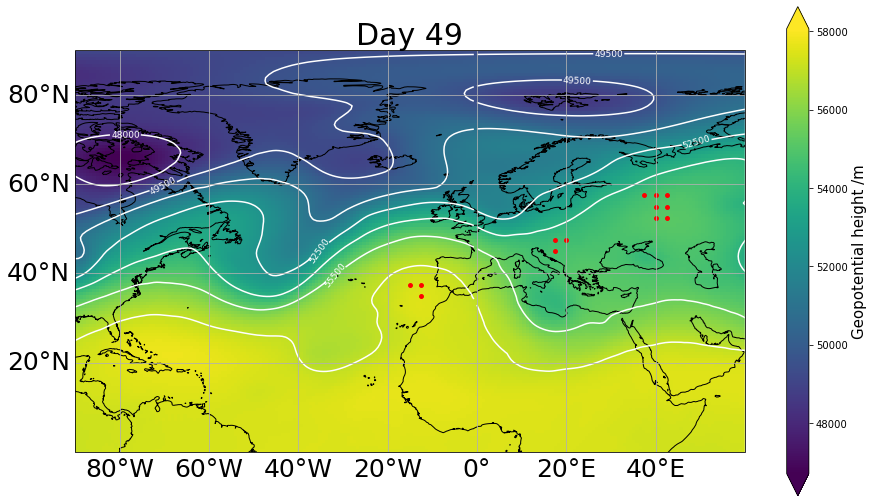

In [48]:
plot_of_blocks(1,50, instantaneous_blocking_list, data,data_roar) #here blocking list is our list of blocked 


In [33]:
# how to reshape array
arr_reshaped = arr.reshape(arr.shape[0], -1)
np.savetxt("geekfile.txt", arr_reshaped)

# then load
load_original_arr = loaded_arr.reshape(
    loaded_arr.shape[0], loaded_arr.shape[1] // arr.shape[2], arr.shape[2])


AttributeError: 'DataArray' object has no attribute 'reshape'